### TensorFlow Speech Recognition Challenge 
- [Kaggle kernel](https://www.kaggle.com/davids1992/speech-visualization-and-exploration)
- 음성 표현의 문제를 파악하기 위한 것입니다. 또한 이 데이터 세트와 관련된 기능을 살펴보고 싶습니다.

### Reference
- [딥러닝으로 Sound Event Detection (황승원)](https://webcache.googleusercontent.com/search?q=cache:IsVx7mW1GjgJ:https://ccei.creativekorea.or.kr/daejeon/json/common/fileDown.download%3Fuuid%3D2017092917012708d89501-2982-4a0a-a4fe-372b769a6976+&cd=46&hl=ko&ct=clnk&gl=kr&lr=lang_ko)
- [서강대학교 TensorFlow를 이용한 음향인식기 제작](http://cscp2.sogang.ac.kr/CSE5311/index.php/Tensor_Flow%EB%A5%BC_%EC%9D%B4%EC%9A%A9%ED%95%9C_%EC%9D%8C%ED%96%A5%EC%9D%B8%EC%8B%9D%EA%B8%B0_%EC%A0%9C%EC%9E%91)
- [log-mel coefficient / filter bank coeff](http://fbsight.com/t/speech-recognition-frequncy-domain-feature-mfcc/126437/24)
- [Urban Sound Classification](https://tensorflow.blog/2016/11/06/urban-sound-classification/)
- [음향 음성학의 이해](http://contents.kocw.net/KOCW/document/2015/pusan/kwonsoonbok/9.pdf)
- [최근우님의 음성/음악신호+머신러닝 초심자를 위한 가이드](http://keunwoochoi.blogspot.kr/search?q=%EC%9D%8C%EC%95%85%EC%8B%A0%ED%98%B8+%EB%A8%B8%EC%8B%A0%EB%9F%AC%EB%8B%9D+%EC%B4%88%EC%8B%AC%EC%9E%90%EB%A5%BC+%EC%9C%84%ED%95%9C+%EA%B0%80%EC%9D%B4%EB%93%9C&max-results=20&by-date=true)
- [VAD1](https://github.com/marsbroshok/VAD-python)
- [VAD2](https://www.kaggle.com/holzner/voice-activity-detection-example)
- [샘플링 레이트](https://ko.wikipedia.org/wiki/%EC%83%98%ED%94%8C%EB%A7%81_%EB%A0%88%EC%9D%B4%ED%8A%B8)
- [음성 데이터 분할](https://www.kaggle.com/robertkag/split-by-user)

In [0]:
import os
from os.path import isdir, join
from pathlib import Path
import pandas as pd

# Math
import numpy as np
from scipy.fftpack import fft
from scipy import signal
from scipy.io import wavfile
import librosa

from sklearn.decomposition import PCA

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import IPython.display as ipd
import librosa.display

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import pandas as pd

%matplotlib inline

### 1. 시각화

- 인간의 청력에 관한 두 가지 이론이 있습니다. (주파수 기반 및 시간적) 
- 음성 인식에서 스펙트로그램 (주파수)을 입력하는 두 가지 주요 경향과 더 정교한 기능인 MFCC - 멜주파수 Cepstral 계수, PLP를 봅니다. 원시, 임시 데이터로 작업하는 경우는 거의 없습니다. 일부 녹음을 시각화합시다!

#### 1.1. 웨이브 및 스펙트로그램 

- 다음 파일을 선택하여 읽으십시오

In [0]:
train_audio_path = './audio/'
filename = '/yes/0a7c2a8d_nohash_0.wav'
sample_rate, samples = wavfile.read(str(train_audio_path) + filename)

In [0]:
filename2 = '/down/0a9f9af7_nohash_2.wav'
sample_rate2, samples2 = wavfile.read(str(train_audio_path) + filename2)

In [0]:
sample_rate

16000

In [0]:
sample_rate2

16000

In [0]:
samples

array([ 14,  -7, -14, ...,  19,  20,  27], dtype=int16)

In [0]:
samples2

array([   52,    89,    84, ...,  -910, -1045,  -616], dtype=int16)

In [0]:
int(round(20 * sample_rate / 1e3))

320

In [0]:
int(round(10 * sample_rate / 1e3))

160

- 스펙트로그램을 계산하는 함수를 정의하십시오.

- 우리가 스펙트로그램 값의 대수를 취하고 있음을 주목하십시오. 그것은 우리의 계획을 훨씬 더 분명하게 만들 것이며, 또한 사람들의 말을 듣는 방식과 밀접하게 연관되어 있습니다. 우리는 대수에 대한 입력으로 0 값이 없음을 보장해야합니다.

- [헤밍 윈도우 함수](http://blog.naver.com/PostView.nhn?blogId=ksunghwank&logNo=140119596852)

In [0]:
def log_specgram(audio, sample_rate, window_size=20,
                 step_size=10, eps=1e-10):
    nperseg = int(round(window_size * sample_rate / 1e3))
    noverlap = int(round(step_size * sample_rate / 1e3))
    freqs, times, spec = signal.spectrogram(audio,
                                    fs=sample_rate, #fs = Sampling frequency of the x time series. Defaults to 1.0.
                                    window='hann', #str or tuple or array_like, optional
                                    nperseg=nperseg, #Length of each segment. Defaults to None, but if window is str or tuple, is set to 256, and if window is array_like, is set to the length of the window.
                                    noverlap=noverlap, #Number of points to overlap between segments. If None, noverlap = nperseg // 8. Defaults to None.
                                    detrend=False) #각 세그먼트를 트랩하는 방법을 지정합니다. detrend가 문자열이면 detrend 함수에 형식 인수로 전달됩니다. 함수이면 세그먼트를 가져와 detrended 세그먼트를 반환합니다. detrend가 False이면 detrending이 수행되지 않습니다. 기본값은 '상수'입니다.
    return freqs, times, np.log(spec.T.astype(np.float32) + eps)

In [0]:
freqs, times, spectrogram = log_specgram(samples, sample_rate)

In [0]:
times

array([ 0.01,  0.02,  0.03,  0.04,  0.05,  0.06,  0.07,  0.08,  0.09,
        0.1 ,  0.11,  0.12,  0.13,  0.14,  0.15,  0.16,  0.17,  0.18,
        0.19,  0.2 ,  0.21,  0.22,  0.23,  0.24,  0.25,  0.26,  0.27,
        0.28,  0.29,  0.3 ,  0.31,  0.32,  0.33,  0.34,  0.35,  0.36,
        0.37,  0.38,  0.39,  0.4 ,  0.41,  0.42,  0.43,  0.44,  0.45,
        0.46,  0.47,  0.48,  0.49,  0.5 ,  0.51,  0.52,  0.53,  0.54,
        0.55,  0.56,  0.57,  0.58,  0.59,  0.6 ,  0.61,  0.62,  0.63,
        0.64,  0.65,  0.66,  0.67,  0.68,  0.69,  0.7 ,  0.71,  0.72,
        0.73,  0.74,  0.75,  0.76,  0.77,  0.78,  0.79,  0.8 ,  0.81,
        0.82,  0.83,  0.84,  0.85,  0.86,  0.87,  0.88,  0.89,  0.9 ,
        0.91,  0.92,  0.93,  0.94,  0.95,  0.96,  0.97,  0.98,  0.99])

In [0]:
freqs

array([    0.,    50.,   100.,   150.,   200.,   250.,   300.,   350.,
         400.,   450.,   500.,   550.,   600.,   650.,   700.,   750.,
         800.,   850.,   900.,   950.,  1000.,  1050.,  1100.,  1150.,
        1200.,  1250.,  1300.,  1350.,  1400.,  1450.,  1500.,  1550.,
        1600.,  1650.,  1700.,  1750.,  1800.,  1850.,  1900.,  1950.,
        2000.,  2050.,  2100.,  2150.,  2200.,  2250.,  2300.,  2350.,
        2400.,  2450.,  2500.,  2550.,  2600.,  2650.,  2700.,  2750.,
        2800.,  2850.,  2900.,  2950.,  3000.,  3050.,  3100.,  3150.,
        3200.,  3250.,  3300.,  3350.,  3400.,  3450.,  3500.,  3550.,
        3600.,  3650.,  3700.,  3750.,  3800.,  3850.,  3900.,  3950.,
        4000.,  4050.,  4100.,  4150.,  4200.,  4250.,  4300.,  4350.,
        4400.,  4450.,  4500.,  4550.,  4600.,  4650.,  4700.,  4750.,
        4800.,  4850.,  4900.,  4950.,  5000.,  5050.,  5100.,  5150.,
        5200.,  5250.,  5300.,  5350.,  5400.,  5450.,  5500.,  5550.,
      

In [0]:
spectrogram

array([[ -6.77941322,  -5.36434603,  -1.51052022, ..., -10.74520206,
        -12.88787079, -16.58613777],
       [-10.96216202,  -7.04926777,  -1.57102859, ..., -11.8468647 ,
        -13.04884148, -14.15116978],
       [ -8.91054153,  -3.92560267,  -1.43297458, ..., -10.77216911,
        -10.8054409 , -11.91253853],
       ..., 
       [ -6.80252361,  -7.5047369 ,  -0.75039238, ..., -12.56122589,
        -13.36528587, -15.03874969],
       [-11.12948513,  -6.57798243,  -0.93677992, ..., -10.45614147,
        -11.50472069, -14.74232864],
       [-13.30939579,  -2.29919553,  -1.15753019, ..., -10.8144083 ,
        -10.40324211, -10.6833086 ]], dtype=float32)

In [0]:
len(times)

99

In [0]:
len(freqs)

161

In [0]:
freqs.max()

8000.0

In [0]:
len(spectrogram.T)

161

In [0]:
spectrogram.T

array([[-23.0258503 , -23.0258503 , -23.0258503 , ...,  -4.33342981,
         -4.30697632, -10.48511219],
       [-23.0258503 , -23.0258503 , -23.0258503 , ...,  -5.14550686,
         -4.29202032, -12.82032871],
       [-23.0258503 , -23.0258503 , -23.0258503 , ...,  -8.52645206,
         -6.74039936, -10.03886318],
       ..., 
       [-23.0258503 , -23.0258503 , -23.0258503 , ..., -12.43983459,
        -12.34705162, -18.45061493],
       [-23.0258503 , -23.0258503 , -23.0258503 , ..., -12.86417007,
        -14.5035038 , -17.27895546],
       [-23.0258503 , -23.0258503 , -23.0258503 , ..., -13.37518978,
        -15.97436428, -18.04657936]], dtype=float32)

In [0]:
sample_rate

16000

In [0]:
samples.max()

6997

In [0]:
samples

array([ 14,  -7, -14, ...,  19,  20,  27], dtype=int16)

Nyquist 정리에 따르면 주파수는 범위 (0, 8000)입니다.

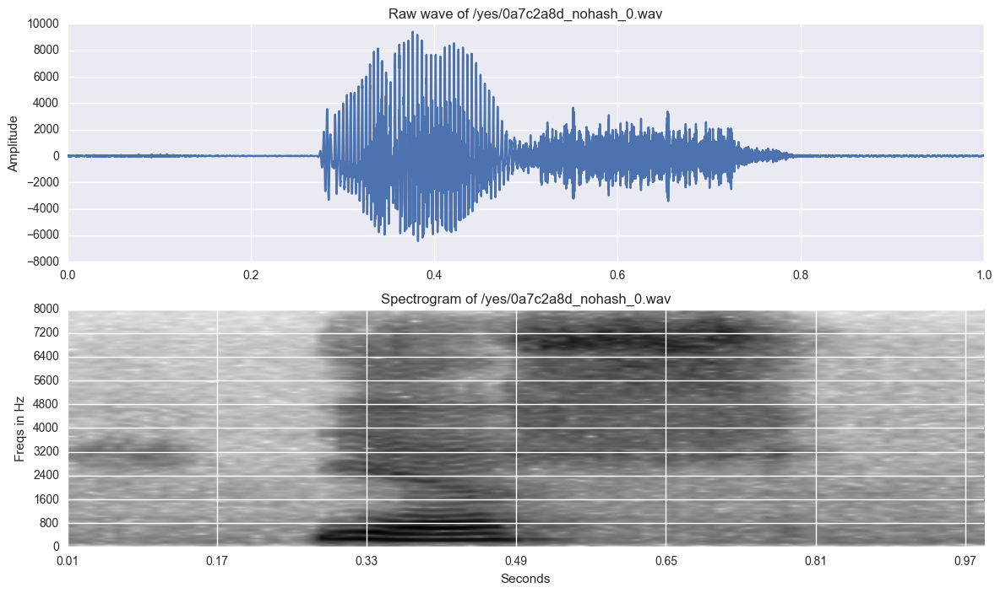

In [0]:
fig = plt.figure(figsize=(14, 8))
ax1 = fig.add_subplot(211)
ax1.set_title('Raw wave of ' + filename)
ax1.set_ylabel('Amplitude')
ax1.plot(np.linspace(0, sample_rate/len(samples), sample_rate), samples)

ax2 = fig.add_subplot(212)
ax2.imshow(spectrogram.T, aspect='auto', origin='lower', 
           extent=[times.min(), times.max(), freqs.min(), freqs.max()])
ax2.set_yticks(freqs[::16])
ax2.set_xticks(times[::16])
ax2.set_title('Spectrogram of ' + filename)
ax2.set_ylabel('Freqs in Hz')
ax2.set_xlabel('Seconds')

In [0]:
mean = np.mean(spectrogram, axis=0)
std = np.std(spectrogram, axis=0)
spectrogram = (spectrogram - mean) / std

- 스펙트로그램(Spectrogram)은 소리나 파동을 시각화하여 파악하기 위한 도구로, 파형(waveform)과 스펙트럼(spectrum)의 특징이 조합되어 있다. 파형에서는 시간축의 변화에 따른 진폭 축의 변화를 볼 수 있고, 스펙트럼에서는 주파수 축의 변화에 따른 진폭 축의 변화를 볼 수 있는 반면, 스펙트로그램에서는 시간축과 주파수 축의 변화에 따라 진폭의 차이를 인쇄 농도 / 표시 색상의 차이로 나타낸다.

- 우리는 스펙트로그램을 NN의 입력 기능으로 사용하므로 기능을 표준화 해야한다는 것을 기억해야 합니다. (우리는 모든 데이터 집합에 대해 정규화 할 필요가 있습니다. 여기서는 단지 하나만을 위한 예제입니다.

### Mel-frequency cepstrum 

- 음성신호처리 분야에서 Mel-frequency cepstrum (MFC)은 단구간 신호의 파워스펙트럼을 표현하는 방법 중 하나로, 비선형적인 Mel스케일의 주파수 도메인에서 로그파워스펙트럼에 코사인변환 (cosine transform)을 취함으로써 얻을 수 있다.
- Mel-frequency cepstral coefficients (MFCCs)는 여러 MFC들을 모아 놓은 계수들을 의미한다.
- MFCC와 일반적인 캡스트럼의 차이는 일반적인 캡스트럼의 경우 주파수 밴드가 균등하게 나누어져 있는 반면 MFCC의 경우 주파수 밴드가 Mel-scale에서 균등하게 나누어진다는 것이다. Mel-scale로의 주파수 워핑은 소리를 더욱 잘 표현할 수 있는 장점이 있다.  따라서 오디오 압축 등에서 사용된다.


- MFCCs는 일반적으로 다음의 과정을 통해 구할 수 있다.

    1. 단구간 음성에 Fourier Transform을 취한다.
    2. 위 값들에서 Mel-scale의 필터뱅크를 이용해 파워스펙트럼을 구한다.
    3. 각 Mel-scale의 파워에 로그를 취한다.
    4. 위 값에 discrete cosine transform 을 취한다.
    5. MFCCs 값이 나온다.

[Mel 주파수 캡스트럼 (MFCC)](https://lbjcom.wordpress.com/article/mel-%EC%A3%BC%ED%8C%8C%EC%88%98-%EC%BA%A1%EC%8A%A4%ED%8A%B8%EB%9F%BC-mfcc-2p9i0m613vquw-10/)

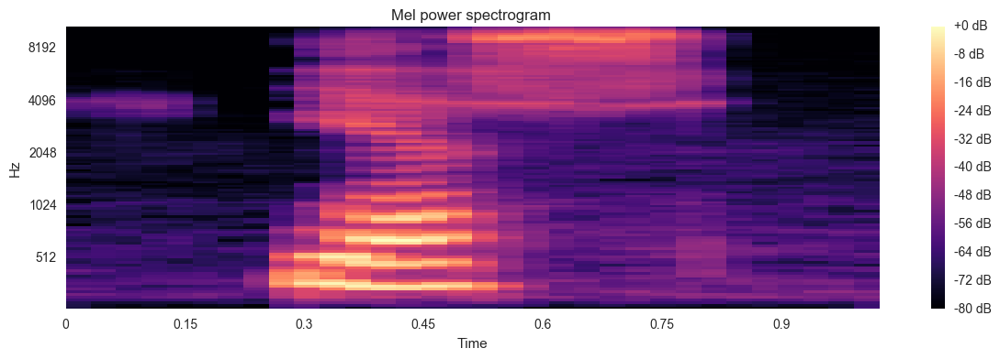

In [0]:
# From this tutorial
# https://github.com/librosa/librosa/blob/master/examples/LibROSA%20demo.ipynb
S = librosa.feature.melspectrogram(samples, sr=sample_rate, n_mels=128) #Mel-scaled power spectrogram, 2

# Convert to log scale (dB). We'll use the peak power (max) as reference.
log_S = librosa.power_to_db(S, ref=np.max) #3

plt.figure(figsize=(12, 4))
librosa.display.specshow(log_S, sr=sample_rate, x_axis='time', y_axis='mel')
plt.title('Mel power spectrogram ')
plt.colorbar(format='%+02.0f dB')
plt.tight_layout()

In [0]:
S.shape

(128, 32)

In [0]:
log_S

array([[-70.81770433, -76.77155735, -80.        , ..., -80.        ,
        -72.32002497, -62.95578084],
       [-69.66192729, -74.91368926, -77.02213077, ..., -73.37424368,
        -72.42004448, -64.27512533],
       [-68.74615104, -72.26617343, -71.90836455, ..., -64.7090027 ,
        -68.33304544, -62.83596966],
       ..., 
       [-80.        , -80.        , -80.        , ..., -80.        ,
        -80.        , -80.        ],
       [-80.        , -80.        , -80.        , ..., -80.        ,
        -80.        , -80.        ],
       [-80.        , -80.        , -80.        , ..., -80.        ,
        -80.        , -80.        ]])

- 우리는 각 프레임에 대해 ~ 160 개의 특징을 가지고 있으며, 주파수는 0과 8000 사이입니다. 
- 하나의 특징이 50 Hz에 해당한다는 것을 의미합니다. 그러나 귀의 주파수 해상도는 1000Hz ~ 2000Hz의 옥타브 내에서 3.6Hz입니다. 이는 사람이 훨씬 정확하고 위의 스펙트로그램으로 표현 된 것보다 훨씬 작은 세부 사항을들을 수 있다는 것을 의미합니다.

### 1.2. MFCC

- MFCC에 대한 자세한 내용을 알고 싶다면 이 훌륭한 자습서를 살펴보십시오. MFCC는 인간의 청력을 모방 할 준비가 되어 있다는 것을 알 수 있습니다.
- 예를 들어 librosa python 패키지를 사용하여 Mel power 스펙트로그램과 MFCC를 계산할 수 있습니다.

[[-1.05753229 -0.66434178 -0.2038121   0.24569163  0.762473    1.20595896
   1.42984909  1.32678599  0.90034793  0.28147582 -0.33928122 -1.10764105
  -2.07157856 -2.63344696 -3.18577212 -3.72408021 -4.11503437 -4.16409679
  -3.60384177 -2.12801962  0.03828085  2.42237275  4.96269487  6.97943947
   7.98817629  7.85744228  6.63129052  4.51358329  1.92815048 -0.59663313
  -2.67037766 -3.86048164]
 [-0.4400755  -0.34829065 -0.1640153   0.11577693  0.6758207   1.46914512
   2.08893598  2.18610262  1.67720296  0.57381361 -0.86531614 -2.21046066
  -3.14682606 -3.06282025 -1.87285245 -0.05946299  1.74920356  3.06447517
   3.41144982  2.64872283  1.20858391 -0.5140362  -2.07139045 -3.16407563
  -3.69205538 -3.6310123  -3.02156745 -2.03461405 -0.92292925  0.21758613
   1.28156814  2.00907006]]


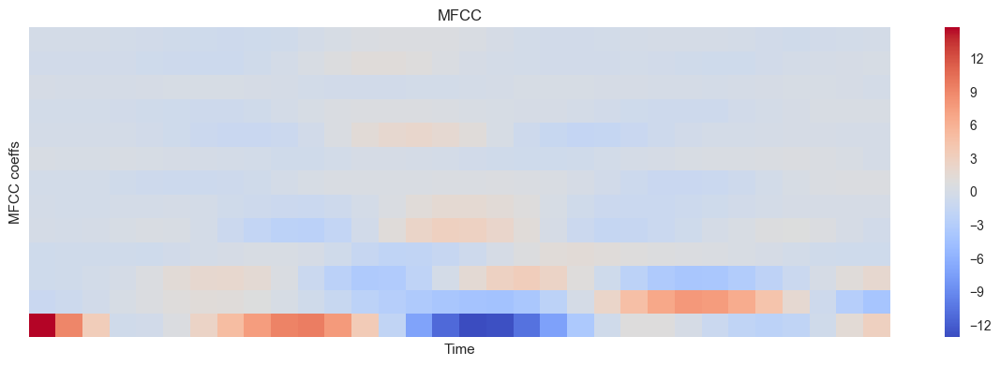

In [0]:
mfcc = librosa.feature.mfcc(S=log_S, n_mfcc=13)

# Let's pad on the first and second deltas while we're at it
delta2_mfcc = librosa.feature.delta(mfcc, order=2)

#delta https://librosa.github.io/librosa/generated/librosa.feature.delta.html
print(delta2_mfcc[1:3])
plt.figure(figsize=(12, 4))
librosa.display.specshow(delta2_mfcc)
plt.ylabel('MFCC coeffs')
plt.xlabel('Time')
plt.title('MFCC')
plt.colorbar()
plt.tight_layout()

In [0]:
mfcc.shape # mfcc 계수의 개수, 프레임의 갯수

(13, 32)

In [0]:
import sklearn

In [0]:
mfccs = sklearn.preprocessing.scale(mfcc, axis=1)
print (mfccs.mean(axis=1))
print (mfccs.var(axis=1))

[ -1.73472348e-17   4.16333634e-17  -5.55111512e-17  -5.55111512e-17
   0.00000000e+00  -2.77555756e-17   1.38777878e-17   0.00000000e+00
  -1.38777878e-17   0.00000000e+00   1.38777878e-16   2.77555756e-17
  -2.77555756e-17]
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


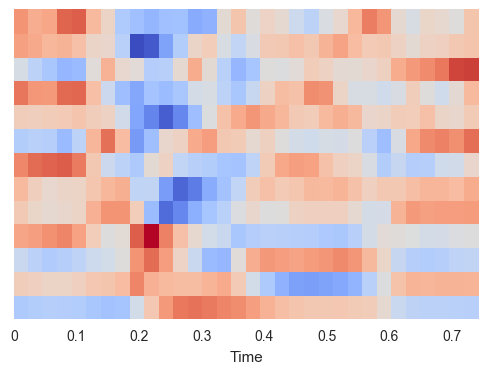

In [0]:
librosa.display.specshow(mfccs, x_axis='time')

- In this case, mfcc computed 13 MFCCs over 32 frames.

In [0]:
delta2_mfcc.shape

(13, 32)

- 클래식하지만 여전히 최첨단 시스템에서 MFCC 또는 유사한 기능은 스펙트로그램 대신 시스템에 대한 입력으로 사용됩니다.
- 그러나 종단 간 (종종 신경망 기반) 시스템에서 가장 일반적인 입력 기능은 원시 스펙트로그램 또는 멜 파워 스펙트로그램 일 것입니다. 
- 예를 들어, MFCC는 피쳐를 비 연관 시키지만, NN은 상관 된 피처를 잘 처리합니다. 또한 멜 필터를 이해한다면 사용법을 현명하게 생각할 수 있습니다 


### 3D에서 스펙트로그램

- 그런데 시간이 변하고 도구가 바뀝니다. 3D로 스펙트로그램을 본 적이 있습니까?

In [0]:
data = [go.Surface(z=spectrogram.T)]
layout = go.Layout(
    title='Specgtrogram of "yes" in 3d',
    scene = dict(
    yaxis = dict(title='Frequencies', range=freqs),
    xaxis = dict(title='Time', range=times),
    zaxis = dict(title='Log amplitude'),
    ),
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

- 축 범위를 적절한 값으로 설정하는 방법을 모르겠다. 위의 클래식 스펙트로그램처럼 거리를 두기를 바란다.

### 1.3. 침묵 제거

- 그 파일을 들어 봅시다.

In [0]:
ipd.Audio(samples, rate=sample_rate)

- 일부 VAD (Voice Activity Detection)가 여기에서 정말 유용 할 것으로 생각합니다. 낱말이 짧더라도, 그(것)들에있는 많은 침묵이있다. 
- 괜찮은 VAD는 교육 규모를 크게 줄여 교육 속도를 크게 가속화 할 수 있습니다. 파일의 처음부터 끝까지 잘라내 자. 위의 그림을 토대로 4000에서 13000까지 걸립니다.
- VAD : 음성과 비음성 구간을 검출하는 음성 검출기

- 음성 활동 감지(영어: Voice Activity Detection 또는 VAD)는 사람의 음성이 유/무를 검출하는 음성 처리에 적용되는 기술이다. speech detection이라고도 불린다. 
- 주로 음성 인식과 음성 부호화 분야에서 사용된다. 이 기술은 음성 신호처리를 활성화시키거나 오디오의 비언어구간(non-speech section)에서 프로세서들을 비활성화시키기 위해서도 사용한다.

In [0]:
samples_cut = samples[4000:13000]
ipd.Audio(samples_cut, rate=sample_rate)

- 우리는 전체 단어를들을 수 있다는 것에 동의 할 수 있습니다. 
- 모든 파일을 수동으로 잘라내어 간단한 플롯에서 이를 기반으로 하는 것은 불가능합니다. 그러나 예를 들어 webrtcvad 패키지를 사용하면 좋은 VAD를 얻을 수 있습니다.
- 'y' 'e' ''graphems의 추측 된 정렬과 함께 다시 음모를 꾸미죠.

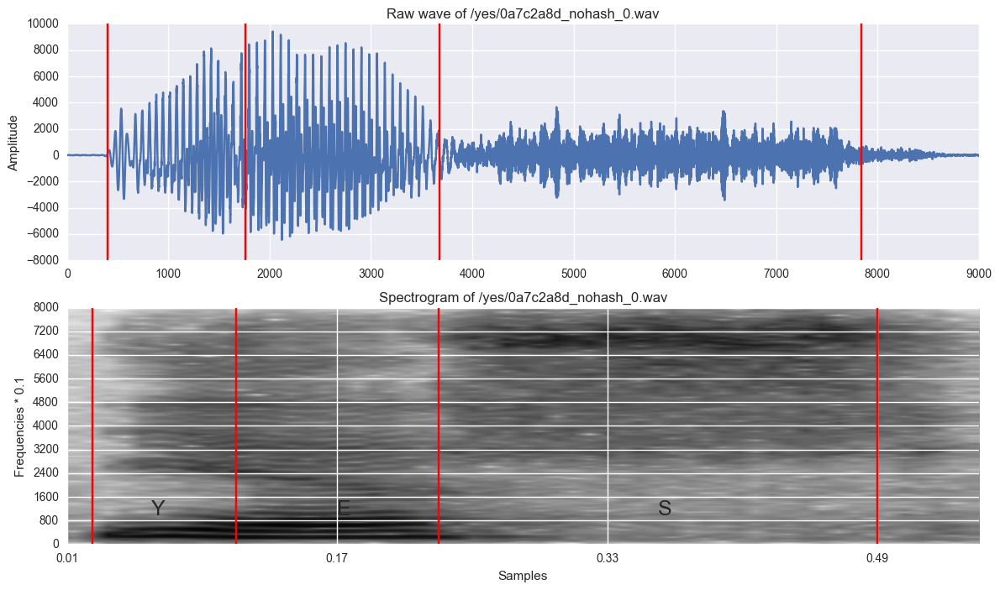

In [0]:
freqs, times, spectrogram_cut = log_specgram(samples_cut, sample_rate)

fig = plt.figure(figsize=(14, 8))
ax1 = fig.add_subplot(211)
ax1.set_title('Raw wave of ' + filename)
ax1.set_ylabel('Amplitude')
ax1.plot(samples_cut)

ax2 = fig.add_subplot(212)
ax2.set_title('Spectrogram of ' + filename)
ax2.set_ylabel('Frequencies * 0.1')
ax2.set_xlabel('Samples')
ax2.imshow(spectrogram_cut.T, aspect='auto', origin='lower', 
           extent=[times.min(), times.max(), freqs.min(), freqs.max()])
ax2.set_yticks(freqs[::16])
ax2.set_xticks(times[::16])
ax2.text(0.06, 1000, 'Y', fontsize=18)
ax2.text(0.17, 1000, 'E', fontsize=18)
ax2.text(0.36, 1000, 'S', fontsize=18)

xcoords = [0.025, 0.11, 0.23, 0.49]
for xc in xcoords:
    ax1.axvline(x=xc*16000, c='r')
    ax2.axvline(x=xc, c='r')

### 1.4. 리샘플링 - 차원 감소

- 데이터의 차원을 줄이는 또 다른 방법은 녹음을 다시 샘플링하는 것입니다.

- 녹음은 16k 주파수로 샘플링되기 때문에 매우 자연스럽게 들리는 것을 들을 수 있습니다. 보통 우리는 더 많이 듣습니다. 그러나 대부분의 음성 관련 주파수는 더 작은 대역으로 표시됩니다. 그렇기 때문에 GSM 신호가 8000 Hz로 샘플링되는 전화기와 통화하는 다른 사람을 여전히 이해할 수 있습니다.

- 요약하면 데이터 세트를 8k로 다시 샘플링 할 수 있습니다. 중요하지 않아야하는 일부 정보를 삭제하고 데이터 크기를 줄입니다.

- 우리는 이것이 위험하기 때문에 위험 할 수 있음을 기억해야합니다. 이는 경쟁이기 때문에 때로는 성능 차이가 매우 작기 때문에 아무 것도 잃고 싶지 않습니다. 다른 한편, 첫 번째 실험은 작은 훈련 크기로 훨씬 빠르게 수행 할 수 있습니다.

- FFT (Fast Fourier Transform)를 계산해야합니다

In [0]:
def custom_fft(y, fs):
    T = 1.0 / fs
    N = y.shape[0]
    yf = fft(y)
    xf = np.linspace(0.0, 1.0/(2.0*T), N//2)
    vals = 2.0/N * np.abs(yf[0:N//2])  # FFT is simmetrical, so we take just the first half
    # FFT is also complex, to we take just the real part (abs)
    return xf, vals

In [0]:
int(8000/sample_rate * samples.shape[0])

8000

- 녹음 내용을 읽고, 다시 샘플링하고 들어 봅시다. 
- 우리는 FFT, Notice를 비교할 수도 있습니다. 원래 신호에서 4000 Hz 이상의 정보가 거의 없다는 것입니다.

In [0]:
filename = '/happy/0b09edd3_nohash_0.wav'
new_sample_rate = 8000

sample_rate, samples = wavfile.read(str(train_audio_path) + filename)
resampled = signal.resample(samples, int(new_sample_rate/sample_rate * samples.shape[0]))

In [0]:
resampled.shape

(8000,)

In [0]:
ipd.Audio(samples, rate=sample_rate)

In [0]:
ipd.Audio(resampled, rate=new_sample_rate)

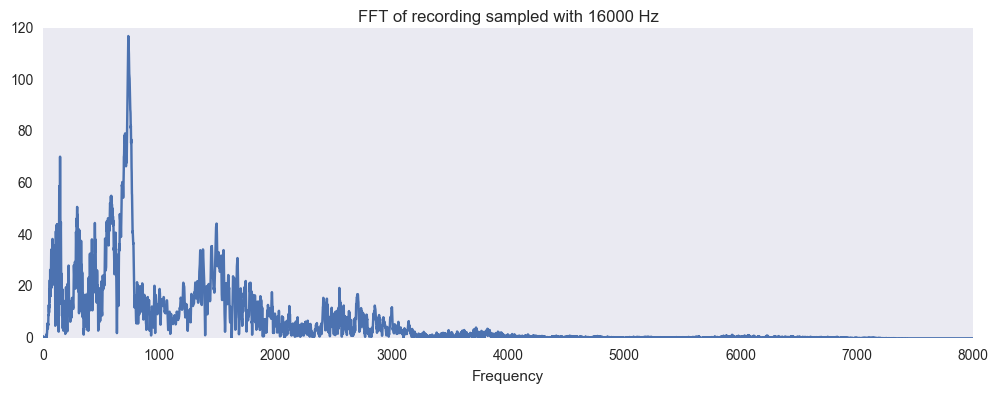

In [0]:
xf, vals = custom_fft(samples, sample_rate)
plt.figure(figsize=(12, 4))
plt.title('FFT of recording sampled with ' + str(sample_rate) + ' Hz')
plt.plot(xf, vals)
plt.xlabel('Frequency')
plt.grid()
plt.show()

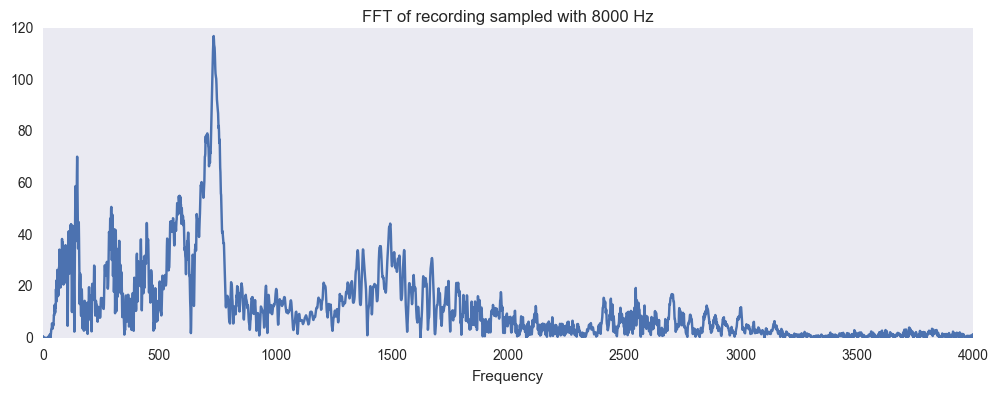

In [0]:
xf, vals = custom_fft(resampled, new_sample_rate)
plt.figure(figsize=(12, 4))
plt.title('FFT of recording sampled with ' + str(new_sample_rate) + ' Hz')
plt.plot(xf, vals)
plt.xlabel('Frequency')
plt.grid()
plt.show()

- 이것이 데이터 세트 크기를 두 번 줄인 방법입니다.

### 1.5. 특징 추출 단계

- 나는 그와 같은 특징 추출 알고리즘을 제안 할 것이다 :

1 .리샘플링
2. VAD
3. 신호가 같은 길이가 되도록 0으로 채우기.
4. 로그 스펙트로 그램 (또는 MFCC, 또는 PLP)
5. 평균 및 표준을 사용한 정규화 기능
6. 시간 정보를 얻기 위해 주어진 프레임 수의 스택

- 그것은 노트북에서 할 수 없는 유감스러운 일입니다. 0에서 물건을 작성하는 것은 별로 의미가 없으며 모든 것이 준비가 되어 있지만 패키지에서는 커널에서 가져올 수 없습니다.

### 2. 데이터 집합 조사

- 데이터 집합의 일부 사용.

#### 2.1. 레코드 수

In [0]:
dirs = [f for f in os.listdir(train_audio_path) if isdir(join(train_audio_path, f))]
dirs.sort()
print('Number of labels: ' + str(len(dirs)))

Number of labels: 31


In [0]:
dirs

['_background_noise_',
 'bed',
 'bird',
 'cat',
 'dog',
 'down',
 'eight',
 'five',
 'four',
 'go',
 'happy',
 'house',
 'left',
 'marvin',
 'nine',
 'no',
 'off',
 'on',
 'one',
 'right',
 'seven',
 'sheila',
 'six',
 'stop',
 'three',
 'tree',
 'two',
 'up',
 'wow',
 'yes',
 'zero']

In [0]:
# Calculate
number_of_recordings = []
for direct in dirs:
    waves = [f for f in os.listdir(join(train_audio_path, direct)) if f.endswith('.wav')]
    number_of_recordings.append(len(waves))

# Plot
data = [go.Histogram(x=dirs, y=number_of_recordings)]
trace = go.Bar(
    x=dirs,
    y=number_of_recordings,
    marker=dict(color = number_of_recordings, colorscale='Viridius', showscale=True
    ),
)
layout = go.Layout(
    title='Number of recordings in given label',
    xaxis = dict(title='Words'),
    yaxis = dict(title='Number of recordings')
)
py.iplot(go.Figure(data=[trace], layout=layout))

- 데이터 세트는 background_noise를 제외하고는 균형을 이루지 만 다른 점입니다.

### 2.2. 녹음 내용 깊숙히 들여다보기

- 매우 중요한 사실이 있습니다. 녹음은 매우 다른 출처에서옵니다. 내가 말할 수있는 한, 그들 중 일부는 모바일 GSM 채널에서 올 수 있습니다.

- 그럼에도 불구하고 기차와 테스트 세트에서 하나의 스피커가 발생하지 않는 방식으로 데이터 세트를 분리하는 것이 매우 중요합니다. 
- 그냥 살펴보고 이 두 가지 시험을 들어보십시오.

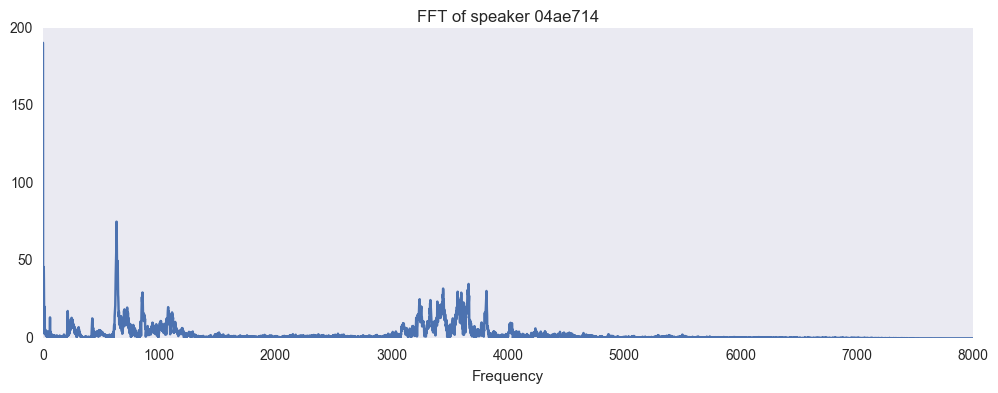

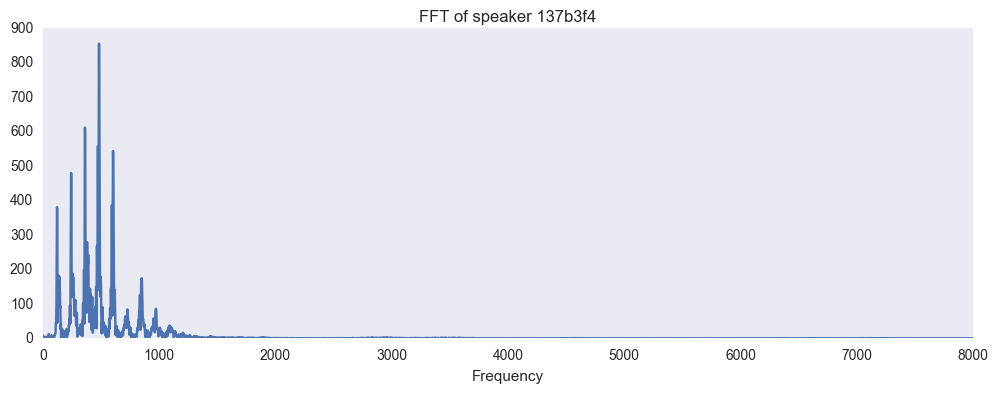

In [0]:
filenames = ['on/004ae714_nohash_0.wav', 'on/0137b3f4_nohash_0.wav']
for filename in filenames:
    sample_rate, samples = wavfile.read(str(train_audio_path) + filename)
    xf, vals = custom_fft(samples, sample_rate)
    plt.figure(figsize=(12, 4))
    plt.title('FFT of speaker ' + filename[4:11])
    plt.plot(xf, vals)
    plt.xlabel('Frequency')
    plt.grid()
    plt.show()

In [0]:
print('Speaker ' + filenames[0][4:11])
ipd.Audio(join(train_audio_path, filenames[0]))

Speaker 04ae714


In [0]:
print('Speaker ' + filenames[1][4:11])
ipd.Audio(join(train_audio_path, filenames[1]))

Speaker 137b3f4


- 어떤 기묘한 침묵 (약간 압축?)을 가진 녹음 또한있다 :

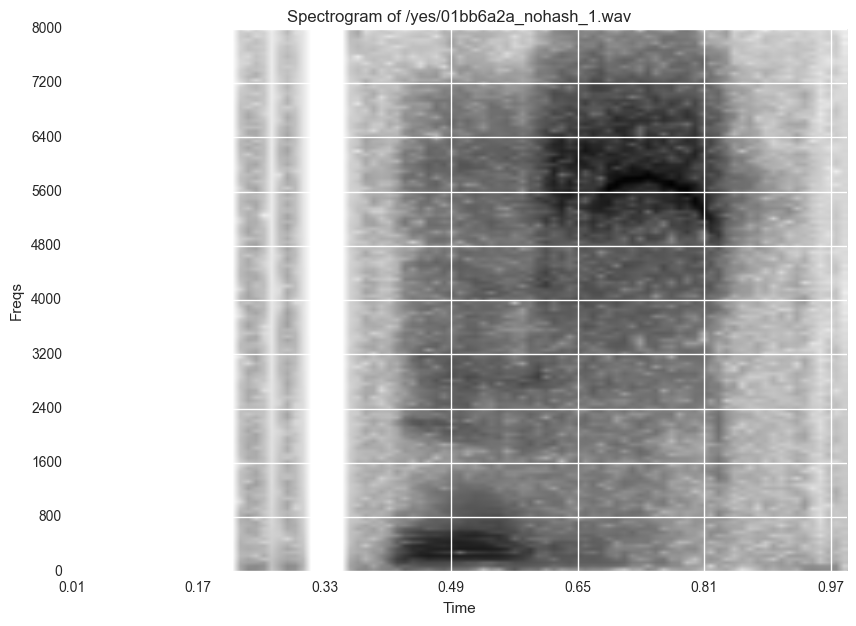

In [0]:
filename = '/yes/01bb6a2a_nohash_1.wav'
sample_rate, samples = wavfile.read(str(train_audio_path) + filename)
freqs, times, spectrogram = log_specgram(samples, sample_rate)

plt.figure(figsize=(10, 7))
plt.title('Spectrogram of ' + filename)
plt.ylabel('Freqs')
plt.xlabel('Time')
plt.imshow(spectrogram.T, aspect='auto', origin='lower', 
           extent=[times.min(), times.max(), freqs.min(), freqs.max()])
plt.yticks(freqs[::16])
plt.xticks(times[::16])
plt.show()

- 그것은 우리가 매우 특정한 음향 환경으로 지나치게 피하는 것을 방지해야 한다는 것을 의미합니다.

### 2.3. 녹음 길이

- 모든 파일에 1 초의 지속 시간이 있는지 확인하십시오.

In [0]:
num_of_shorter = 0
for direct in dirs:
    waves = [f for f in os.listdir(join(train_audio_path, direct)) if f.endswith('.wav')]
    for wav in waves:
        sample_rate, samples = wavfile.read(train_audio_path + direct + '/' + wav)
        if samples.shape[0] < sample_rate:
            num_of_shorter += 1
print('Number of recordings shorter than 1 second: ' + str(num_of_shorter))

/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/scipy/io/wavfile.py:273: WavFileWarning:

Chunk (non-data) not understood, skipping it.



Number of recordings shorter than 1 second: 6469


- 그것은 놀랍습니다. 그리고 그들 중 많은 수가 있습니다. 우리는 그것들을 0으로 채울 수 있습니다.

### 2.4. 평균 스펙트로그램 및 FFT

- 모든 단어에 평균 FFT를 플롯 해보자.

['down', 'go', 'left', 'no', 'off', 'on', 'right', 'stop', 'up', 'yes']


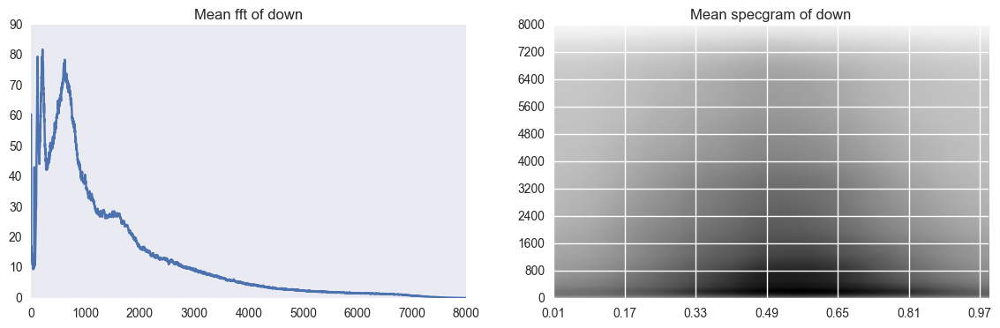

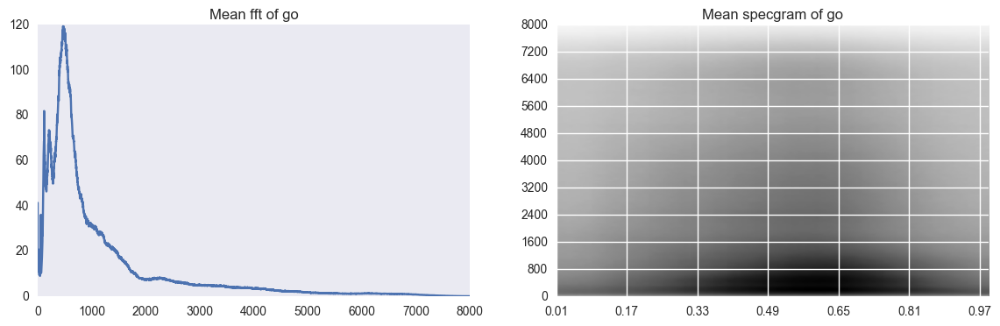

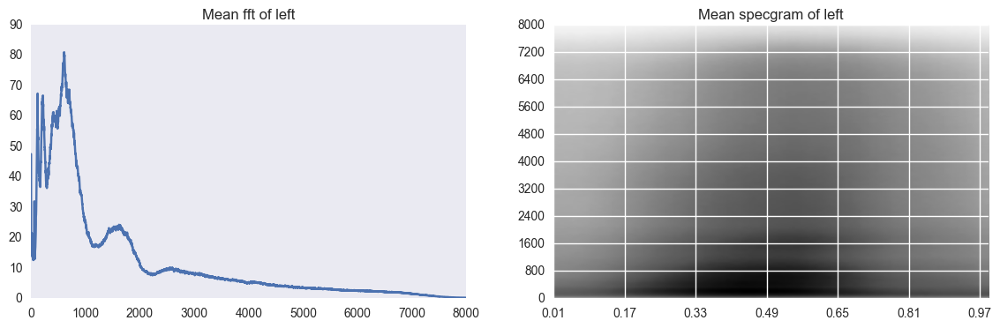

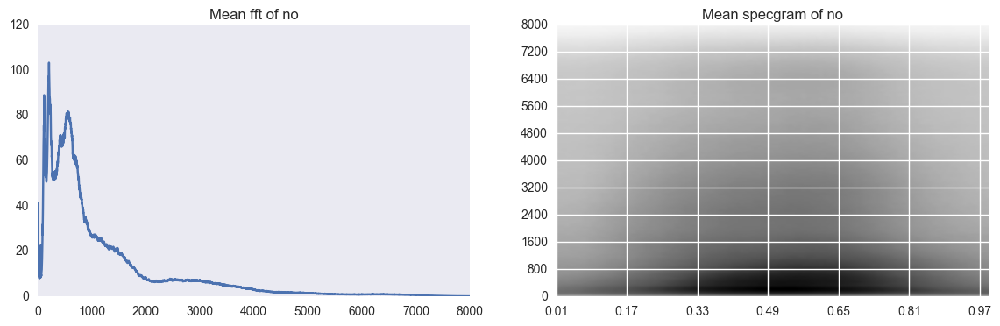

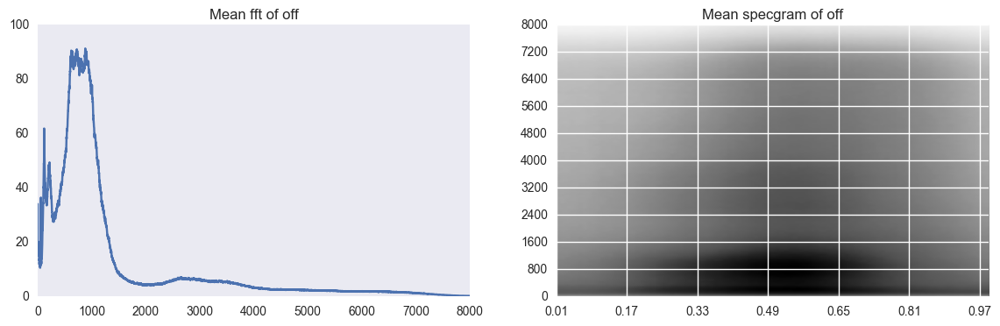

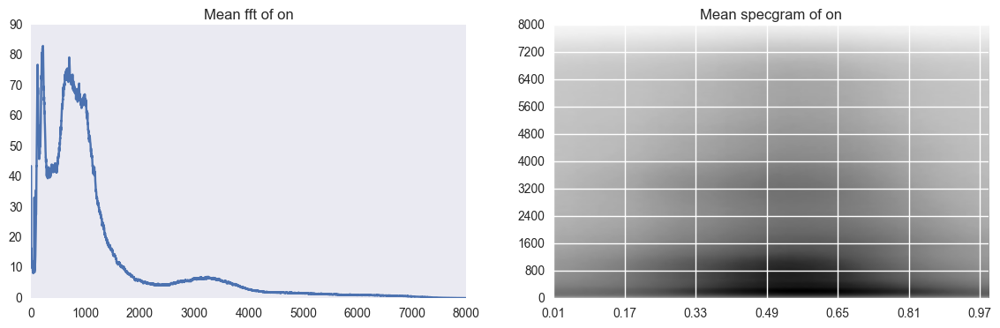

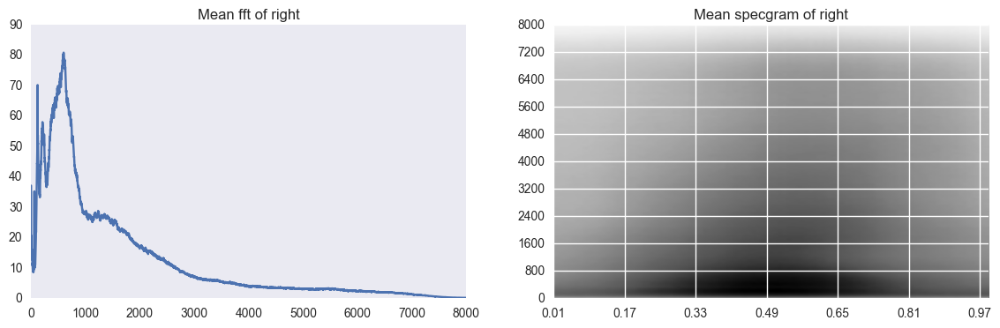

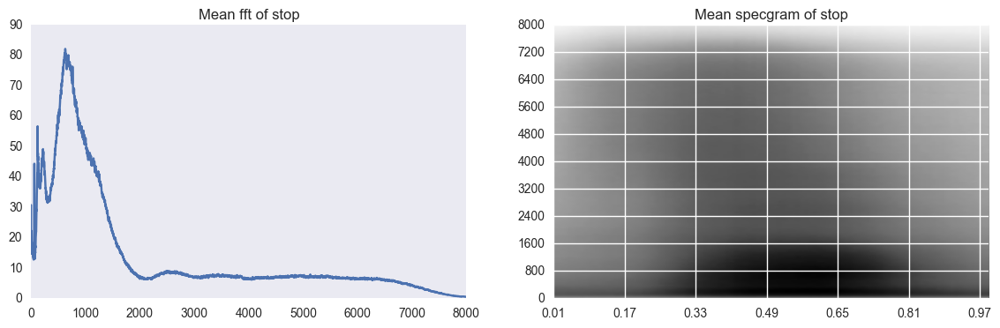

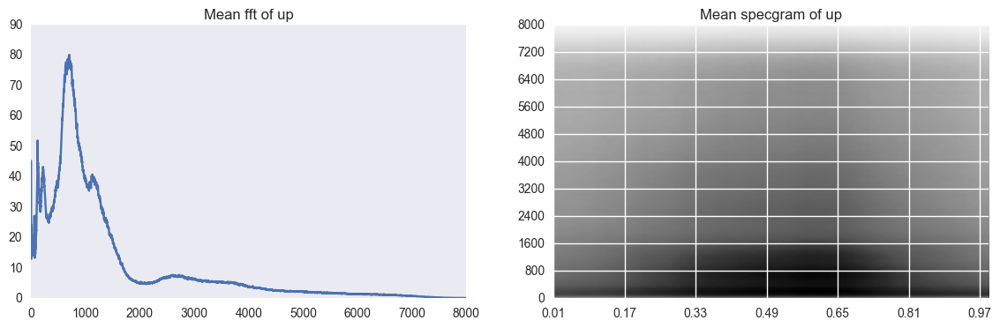

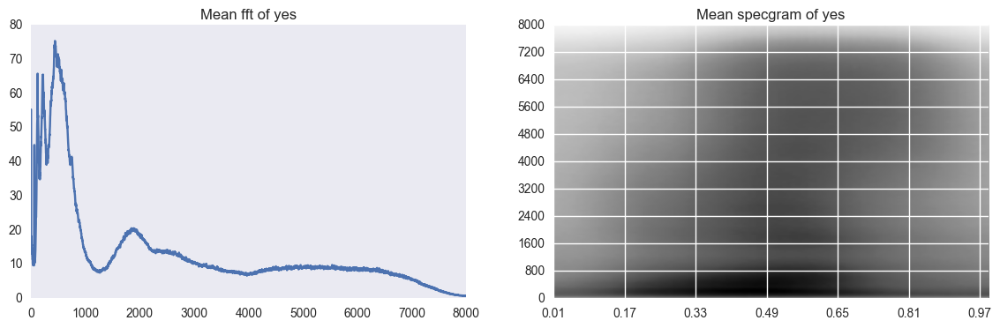

In [0]:
to_keep = 'yes no up down left right on off stop go'.split()
dirs = [d for d in dirs if d in to_keep]

print(dirs)

for direct in dirs:
    vals_all = []
    spec_all = []

    waves = [f for f in os.listdir(join(train_audio_path, direct)) if f.endswith('.wav')]
    for wav in waves:
        sample_rate, samples = wavfile.read(train_audio_path + direct + '/' + wav)
        if samples.shape[0] != 16000:
            continue
        xf, vals = custom_fft(samples, 16000)
        vals_all.append(vals)
        freqs, times, spec = log_specgram(samples, 16000)
        spec_all.append(spec)

    plt.figure(figsize=(14, 4))
    plt.subplot(121)
    plt.title('Mean fft of ' + direct)
    plt.plot(np.mean(np.array(vals_all), axis=0))
    plt.grid()
    plt.subplot(122)
    plt.title('Mean specgram of ' + direct)
    plt.imshow(np.mean(np.array(spec_all), axis=0).T, aspect='auto', origin='lower', 
               extent=[times.min(), times.max(), freqs.min(), freqs.max()])
    plt.yticks(freqs[::16])
    plt.xticks(times[::16])
    plt.show()

### 2.5. 가우스 혼합 모델링

- 평균 FFT는 모든 단어마다 다르게 보입니다. 가우시안 분포를 혼합하여 각 FFT를 모델링 할 수 있습니다. 
- 그러나 그 중 일부는 정지와 같은 FFT에서 거의 동일하게 보입니다 ... 그러나 잠깐, 스펙트로그램을 볼 때 여전히 구별 할 수 있습니다! 고주파수는 정지 시작시 낮은 것보다 빠릅니다 (아마도 s).
- 이것이 시간적 요소가 필요한 이유입니다. Kaldi 라이브러리는 GMM을 사용하여 단어 (또는 단어의 더 작은 부분)를 모델링하고 숨겨진 마르코프 모델을 사용하여 시간 종속성을 모델링 할 수 있습니다.

- 우리는 단어에 간단한 GMM을 사용하여 우리가 무엇을 모델링 할 수 있는지 확인하고 단어를 구별하는 것이 얼마나 어려운지 확인할 수 있습니다. 
- 우리는 Scikit을 사용할 수 있습니다. 그러나 그것을 배우는 것은 간단하지 않고 여기에서 아주 오래 지속됩니다. 그래서 나는 지금이 생각을 포기합니다.

### 2.6. 단어 전체의 빈도 구성 요소

In [0]:
def violinplot_frequency(dirs, freq_ind):
    """ Plot violinplots for given words (waves in dirs) and frequency freq_ind
    from all frequencies freqs."""

    spec_all = []  # Contain spectrograms
    ind = 0
    for direct in dirs:
        spec_all.append([])

        waves = [f for f in os.listdir(join(train_audio_path, direct)) if
                 f.endswith('.wav')]
        for wav in waves[:100]:
            sample_rate, samples = wavfile.read(
                train_audio_path + direct + '/' + wav)
            freqs, times, spec = log_specgram(samples, sample_rate)
            spec_all[ind].extend(spec[:, freq_ind])
        ind += 1

    # Different lengths = different num of frames. Make number equal
    minimum = min([len(spec) for spec in spec_all])
    spec_all = np.array([spec[:minimum] for spec in spec_all])

    plt.figure(figsize=(13,7))
    plt.title('Frequency ' + str(freqs[freq_ind]) + ' Hz')
    plt.ylabel('Amount of frequency in a word')
    plt.xlabel('Words')
    sns.violinplot(data=pd.DataFrame(spec_all.T, columns=dirs))
    plt.show()

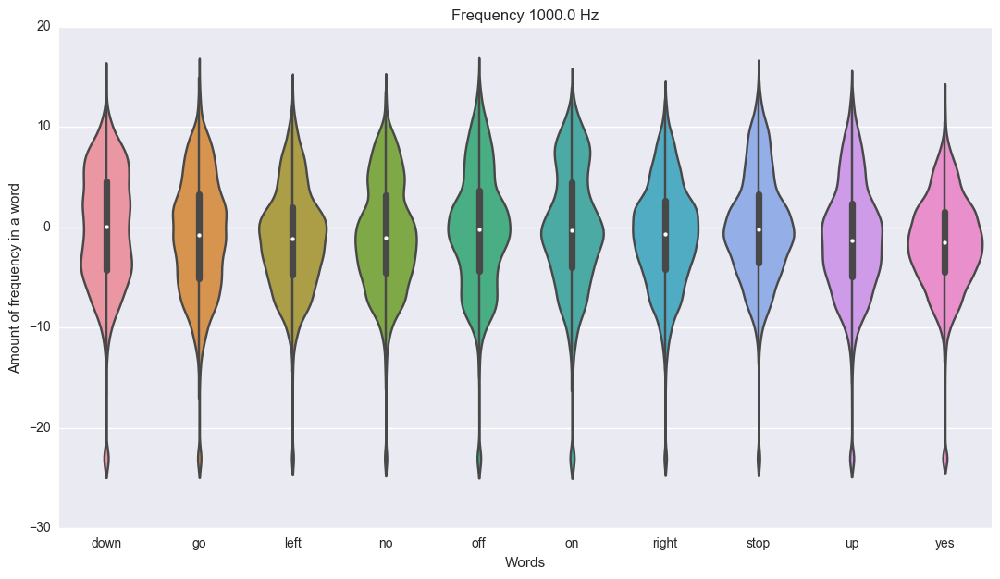

In [0]:
violinplot_frequency(dirs, 20)

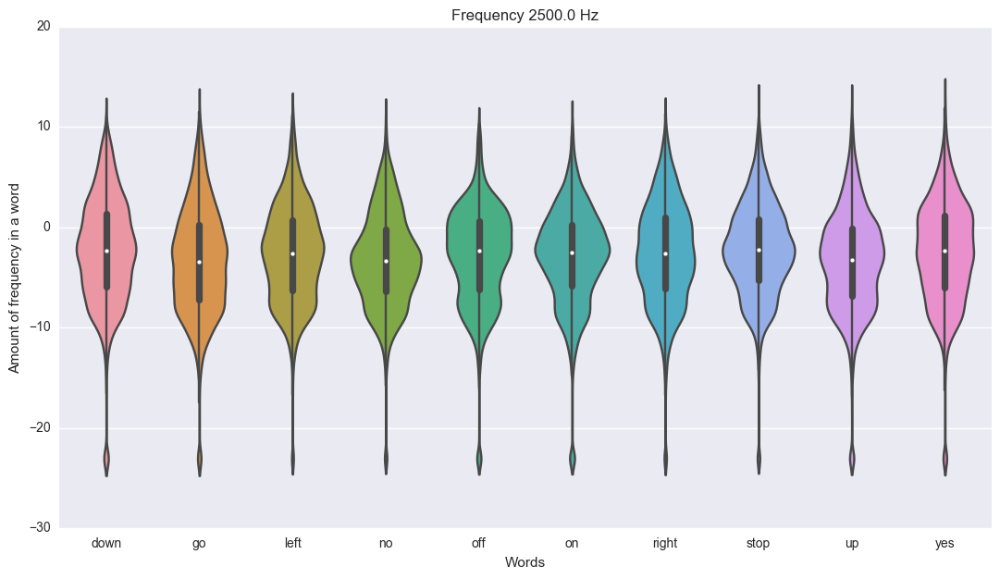

In [0]:
violinplot_frequency(dirs, 50)

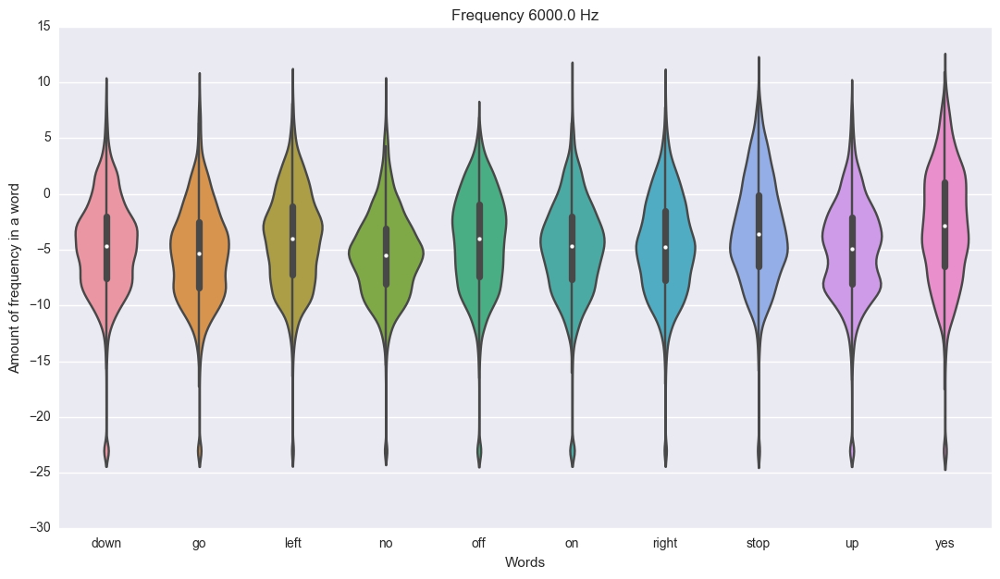

In [0]:
violinplot_frequency(dirs, 120)

### 2.7. 이상 탐지

- 우리는 어떻게 든 나머지 부분에서 눈에 띄는 녹음이 있는지 확인해야합니다. 우리는 데이터 집합의 차원을 낮추고 어떤 예외를 대화식으로 검사 할 수 있습니다. 차원 감소를 위해 PCA를 사용합니다.

In [0]:
fft_all.shape

(23682, 3)

In [0]:
dirs

['down', 'go', 'left', 'no', 'off', 'on', 'right', 'stop', 'up', 'yes']

In [0]:
val

array([ 0.1195    ,  1.94266546,  3.64164076, ...,  3.54653211,
        3.01203841,  1.98085207])

In [0]:
fft_all = []
names = []
for direct in dirs:
    waves = [f for f in os.listdir(join(train_audio_path, direct)) if f.endswith('.wav')]
    for wav in waves:
        sample_rate, samples = wavfile.read(train_audio_path + direct + '/' + wav)
        if samples.shape[0] != sample_rate:
            samples = np.append(samples, np.zeros((sample_rate - samples.shape[0], )))
        x, val = custom_fft(samples, sample_rate)
        fft_all.append(val)
        names.append(direct + '/' + wav)

fft_all = np.array(fft_all)

# Normalization
fft_all = (fft_all - np.mean(fft_all, axis=0)) / np.std(fft_all, axis=0)

# Dim reduction
pca = PCA(n_components=3)
fft_all = pca.fit_transform(fft_all)

def interactive_3d_plot(data, names):
    scatt = go.Scatter3d(x=data[:, 0], y=data[:, 1], z=data[:, 2], mode='markers', text=names)
    data = go.Data([scatt])
    layout = go.Layout(title="Anomaly detection")
    figure = go.Figure(data=data, layout=layout)
    py.iplot(figure)
    
interactive_3d_plot(fft_all, names)

In [0]:
fft_all.shape

(23682, 3)

In [0]:
x.shape

(8000,)

In [0]:
pca

PCA(copy=True, iterated_power='auto', n_components=3, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [0]:
print('Recording go/0487ba9b_nohash_0.wav')
ipd.Audio(join(train_audio_path, 'go/0487ba9b_nohash_0.wav'))

Recording go/0487ba9b_nohash_0.wav


In [0]:
print('Recording yes/e4b02540_nohash_0.wav')
ipd.Audio(join(train_audio_path, 'yes/e4b02540_nohash_0.wav'))


Recording yes/e4b02540_nohash_0.wav


In [0]:
print('Recording seven/e4b02540_nohash_0.wav')
ipd.Audio(join(train_audio_path, 'seven/b1114e4f_nohash_0.wav'))


Recording seven/e4b02540_nohash_0.wav
